In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

In [2]:
df = pd.read_csv("wine_data.csv")
df.head()

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality
0,11.6,0.580,0.66,2.20,0.074,10.0,47.0,1.00080,3.25,0.57,9.0,3
1,10.4,0.610,0.49,2.10,0.200,5.0,16.0,0.99940,3.16,0.63,8.4,3
2,7.4,1.185,0.00,4.25,0.097,5.0,14.0,0.99660,3.63,0.54,10.7,3
3,10.4,0.440,0.42,1.50,0.145,34.0,48.0,0.99832,3.38,0.86,9.9,3
4,8.3,1.020,0.02,3.40,0.084,6.0,11.0,0.99892,3.48,0.49,11.0,3


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21000 entries, 0 to 20999
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed_acidity         21000 non-null  float64
 1   volatile_acidity      21000 non-null  float64
 2   citric_acid           21000 non-null  float64
 3   residual_sugar        21000 non-null  float64
 4   chlorides             21000 non-null  float64
 5   free_sulfur_dioxide   21000 non-null  float64
 6   total_sulfur_dioxide  21000 non-null  float64
 7   density               21000 non-null  float64
 8   pH                    21000 non-null  float64
 9   sulphates             21000 non-null  float64
 10  alcohol               21000 non-null  float64
 11  quality               21000 non-null  int64  
dtypes: float64(11), int64(1)
memory usage: 1.9 MB


In [4]:
df.describe()

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality
count,21000.000000,21000.000000,21000.000000,21000.000000,21000.000000,21000.000000,21000.000000,21000.000000,21000.000000,21000.000000,21000.000000,21000.000000
mean,9.797079,0.774796,0.793870,31.289348,0.200245,129.442333,229.008762,1.009972,3.158712,1.020641,11.291716,6.000000
std,2.413919,0.365015,0.384833,19.015391,0.124933,77.167262,100.183265,0.012032,0.171371,0.408304,1.182198,2.000048
min,3.800000,0.080000,0.000000,0.600000,0.009000,1.000000,6.000000,0.987110,2.720000,0.220000,8.000000,3.000000
25%,7.600000,0.430000,0.410000,9.800000,0.072000,45.000000,150.000000,0.997417,3.030000,0.620000,10.400000,4.000000
50%,10.000000,0.830000,0.870000,37.600000,0.205000,145.800000,240.500000,1.012200,3.150000,1.080000,11.300000,6.000000
75%,11.800000,1.080000,1.110000,46.800000,0.298000,194.325000,311.625000,1.019840,3.270000,1.360000,12.200000,8.000000
max,15.900000,1.580000,1.660000,65.800000,0.611000,289.000000,440.000000,1.038980,4.010000,2.000000,14.900000,9.000000


In [5]:
df.isna().sum()

fixed_acidity           0
volatile_acidity        0
citric_acid             0
residual_sugar          0
chlorides               0
free_sulfur_dioxide     0
total_sulfur_dioxide    0
density                 0
pH                      0
sulphates               0
alcohol                 0
quality                 0
dtype: int64

<Axes: >

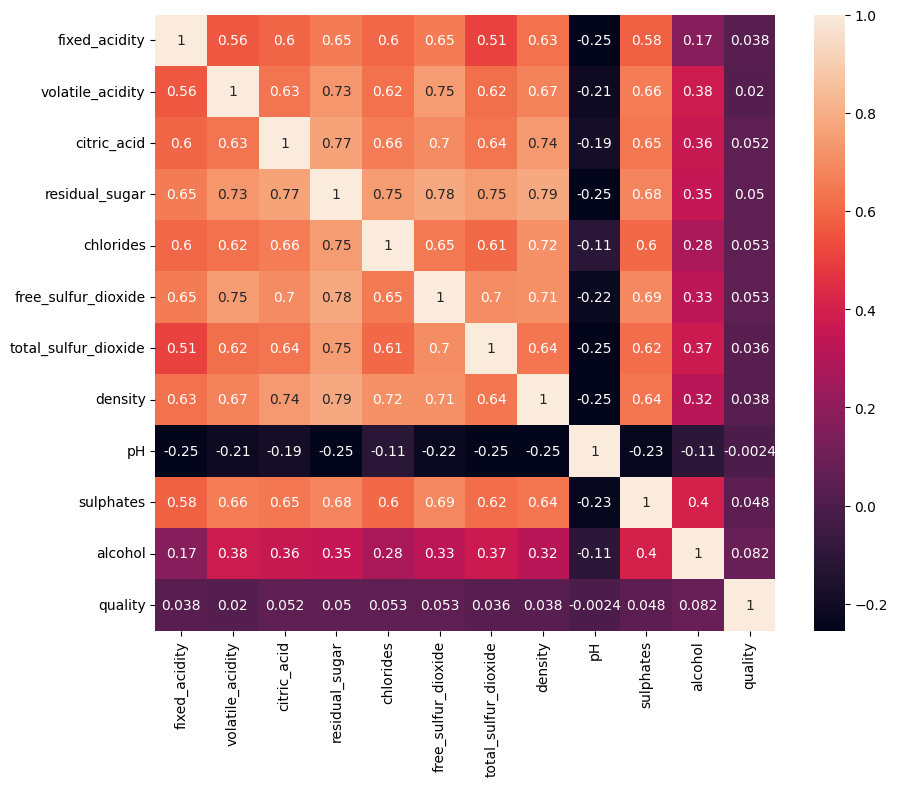

In [6]:
plt.figure(figsize=(10, 8), dpi=100)
sns.heatmap(df.corr(), annot= True)

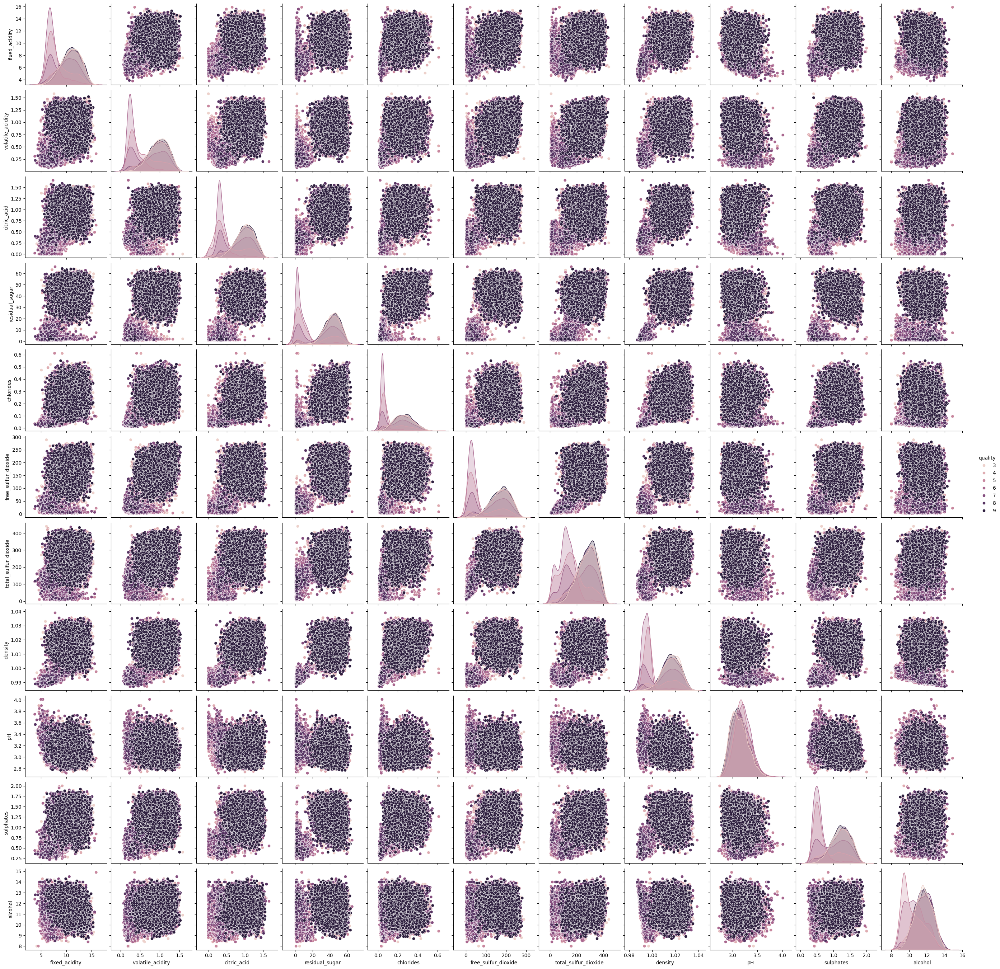

In [7]:
sns.pairplot(data=df, hue="quality")

#### **X and y**

In [8]:
X = df.drop("quality", axis= 1)
y = df["quality"]

#### **train test split**

In [9]:
from sklearn.model_selection import train_test_split

In [10]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=9)

#### **Random Forest Classifier**

In [11]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import ConfusionMatrixDisplay, accuracy_score, classification_report

In [12]:
n_estimators = [50, 100, 150, 200]

for n in n_estimators:
    rand_frst = RandomForestClassifier(n_estimators= n)
    rand_frst.fit(X_train, y_train)

    rand_pred = rand_frst.predict(X_test)
    print(accuracy_score(y_test, rand_pred))
    print("Number of Estimators : ", n)
    print(classification_report(y_test, rand_pred))


0.6461904761904762
Number of Estimators :  50
              precision    recall  f1-score   support

           3       0.53      0.70      0.61       264
           4       0.59      0.60      0.60       306
           5       0.79      0.61      0.69       298
           6       0.65      0.76      0.70       287
           7       0.73      0.55      0.62       295
           8       0.64      0.65      0.65       325
           9       0.66      0.66      0.66       325

    accuracy                           0.65      2100
   macro avg       0.66      0.65      0.65      2100
weighted avg       0.66      0.65      0.65      2100

0.6395238095238095
Number of Estimators :  100
              precision    recall  f1-score   support

           3       0.55      0.73      0.63       264
           4       0.60      0.58      0.59       306
           5       0.78      0.59      0.67       298
           6       0.63      0.74      0.68       287
           7       0.74      0.54      

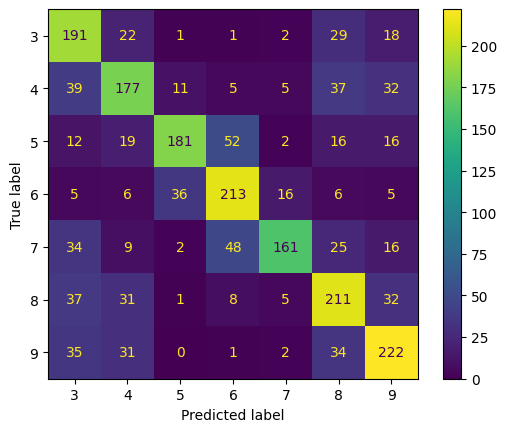

In [13]:
ConfusionMatrixDisplay.from_estimator(rand_frst, X_test, y_test)

### **KNN**


##### **Standart Scaler**

In [18]:
from sklearn.preprocessing import StandardScaler

In [19]:
scaler = StandardScaler()

scaled_X_train = scaler.fit_transform(X_train)
scaled_X_test = scaler.transform(X_test)

In [20]:
from sklearn.neighbors import KNeighborsClassifier

In [22]:
n_neighbours = [1, 3, 5, 7, 9]

for n in n_neighbours:
    knn = KNeighborsClassifier(n_neighbors= n)
    knn.fit(scaled_X_train, y_train)

    knn_pred = knn.predict(scaled_X_test)
    acc = accuracy_score(y_test, knn_pred)

    print(f"Number of Neighbours {n}, accuracy score : {acc}")



Number of Neighbours 1, accuracy score : 0.6314285714285715
Number of Neighbours 3, accuracy score : 0.47333333333333333
Number of Neighbours 5, accuracy score : 0.41523809523809524
Number of Neighbours 7, accuracy score : 0.3985714285714286
Number of Neighbours 9, accuracy score : 0.37666666666666665


In [23]:
best_knn = KNeighborsClassifier(n_neighbors= 1)
best_knn.fit(scaled_X_train, y_train)

KNeighborsClassifier(n_neighbors=1)

In [24]:
best_knn_pred = best_knn.predict(scaled_X_test)

In [25]:
print(classification_report(y_test, best_knn_pred))

              precision    recall  f1-score   support

           3       0.63      0.68      0.65       264
           4       0.61      0.58      0.59       306
           5       0.61      0.58      0.59       298
           6       0.64      0.67      0.65       287
           7       0.63      0.61      0.62       295
           8       0.63      0.66      0.64       325
           9       0.66      0.66      0.66       325

    accuracy                           0.63      2100
   macro avg       0.63      0.63      0.63      2100
weighted avg       0.63      0.63      0.63      2100



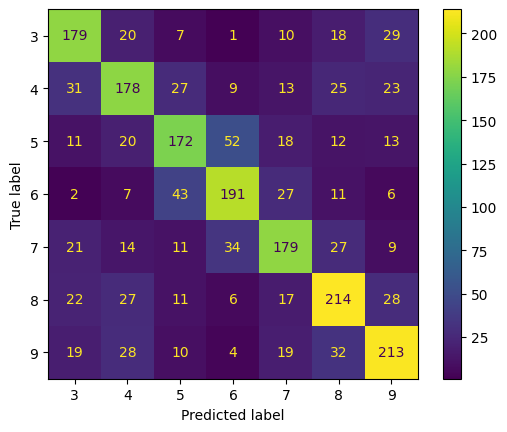

In [26]:
ConfusionMatrixDisplay.from_estimator(best_knn, scaled_X_test, y_test)